# Мария Сухарева

In [1]:
!pip install telethon -q

In [1]:
import csv
from IPython.display import display, Image, Markdown
from itertools import combinations
import math
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms import clique
import numpy as np
import pandas as pd
import re
import seaborn as sns
from sklearn.metrics import normalized_mutual_info_score
from telethon.sync import TelegramClient

import warnings
warnings.filterwarnings("ignore", "Glyph .* missing from font", UserWarning)

## Данные

Данные получены из нескольких групповых чатов Telegram, в которых я состою, с помощью Telegram API (библиотека Telethon); для каждого участника я выгрузила идентификатор, имя, username и принадлежность к выбранным чатам в единый CSV‑файл. Затем я вручную размечала чаты по типам (семья, друзья, учёба и т.д.) в отдельной таблице и объединила её с основной выборкой по названию чата, получив финальный датасет.

Ноды - это уникальные пользователи Telegram (кроме меня), которые состоят хотя бы в одном из выбранных групповых чатов.

Рёбра соединяют двух пользователей, если они состоят хотя бы в одном общем групповом чате; если общих чатов несколько, это отражается в большем весе ребра.

Ненаправленная сеть: если пользователь A состоит в одном чате с пользователем B, то и B состоит в чате с A.

Взвешенная сеть: каждое ребро имеет вес, равный числу общих чатов.

Однородная сеть: только один тип вершин (пользователи) и один тип связей (совместное участие в чатах).

Атрибуты:

Ноды: числовой user_id, текстовые name, username, group_name; через объединение с разметкой чатов каждая нода также связана с типами групп (семья, друзья, учёба, работа и т.п.).

Рёбра: атрибут weight — количество общих групповых чатов между двумя пользователями.

In [ ]:
# убрала здесь личные данные
api_id = ...
api_hash = ''
phone = ''

In [ ]:
client = TelegramClient('session_name', api_id, api_hash)
await client.start(phone)

me = await client.get_me()
my_id = me.id

dialogs = await client.get_dialogs()
groups = [d for d in dialogs if d.is_group]

for i, group in enumerate(groups):
    print(f"{i}: {group.name} (ID: {group.id})")

selection = input("номера групп: ")
selected_indices = [int(x.strip()) for x in selection.split(',') if x.strip().isdigit()]
target_groups = [groups[i] for i in selected_indices]

rows = []


for gi, group in enumerate(target_groups):
    print(f"обработка группы: {group.name}")
    participants = await client.get_participants(group)

    for user in participants:
        if user.id == my_id:
            continue

        user_id = user.id
        name = f"{user.first_name or ''} {user.last_name or ''}".strip()

        rows.append({
            "user_id": user_id,
            "name": name,
            "username": user.username or "",
            "group_idx": gi,
            "group_tg_id": group.id,
            "group_name": group.name
        })

with open("tg_data.csv", "w", encoding="utf-8", newline="") as f:
    if rows:
        writer = csv.DictWriter(f, fieldnames=rows[0].keys())
        writer.writeheader()
        writer.writerows(rows)

await client.disconnect()

0: Тефачки (ID: -787553900)
1: Alt-right party (ID: -1002891225908)
2: :о) мы хотим в экспедицию (ID: -1002170117621)
3: Экспериментальная лингвистика и ИИ 2025 (ID: -4784495619)
4: DL for NLP 2025 (ID: -1003095654976)
5: Гламурный нг (ID: -4826131631)
6: ВК-тренды (внутренний) (ID: -1002342217265)
7: :0) ВАЖНОЕ (ID: -1002433624625)
8: ИИСР (ID: -1003447614917)
9: РКИ проект (коррекционный класс Сас) (ID: -4844257183)
10: HSE Social Networks 2025 (ID: -1003240597254)
11: сходо4ка диф!! (ID: -1001953602456)
12: 2025_HSE_Ontologies (ID: -1002791464938)
13: Проект по онтологиям (ID: -4962915442)
14: 2024 Компьютерная лингвистика (ID: -1002164751550)
15: TFAIM lab chat (ID: -1002277560662)
16: Задача для Марии Егоровой (ID: -4865610601)
17: Типа эксплингва статья туда сюда (ID: -5071741326)
18: NLP smol (ID: -1002600521135)
19: 2 августа 2025 (ID: -1002679870240)
20: ПИС КЛ 2024 (ID: -4519914969)
21: Tumblr Party MSK I 5-6 декабря (ID: -1002907832637)
22: пробинг (ID: -4571202401)
23: Midn

In [ ]:
data = pd.read_csv("tg_data.csv")
cls = pd.read_csv("tg_classification.csv")

cls = cls[["group_name", "class"]]

merged = data.merge(cls, on="group_name", how="left")
merged.to_csv("tg_data_with_class.csv", index=False)

In [84]:
merged.head()

,user_id,name,username,group_idx,group_tg_id,group_name,class
0,1293695386,❤️,irinabarabash2,0,-787553900,Тефачки,семья
1,948057117,Оля,ishk_yapts,0,-787553900,Тефачки,семья
2,1354905725,Будущий 💚,Halcyon999,1,-1002891225908,Alt-right party,друзья
3,469145391,Алиса Комрад 🤜🤛,wonderland_13,1,-1002891225908,Alt-right party,друзья
4,1125600016,Салимат 🍾,Zaydieva,1,-1002891225908,Alt-right party,друзья


## Граф

In [2]:
df = pd.read_csv("tg_data_with_class.csv")

G = nx.Graph()

for user_id, sub in df.groupby("user_id"):
    name = sub["name"].iloc[0]
    username = sub["username"].iloc[0]
    groups = list(sub["group_name"].unique())
    classes = list(sub["class"].dropna().unique())

    G.add_node(
        user_id,
        label=name,
        username=username,
        groups="; ".join(map(str, groups)),
        classes="; ".join(map(str, classes))
    )

for group_idx, sub in df.groupby("group_idx"):
    users = list(sub["user_id"].unique())
    for u, v in combinations(users, 2):
        if G.has_edge(u, v):
            G[u][v]["weight"] += 1
        else:
            G.add_edge(u, v, weight=1)

print("Нод:", G.number_of_nodes())
print("Рёбер:", G.number_of_edges())

nx.write_gexf(G, "tg_graph.gexf")

Нод: 277
Рёбер: 5947


### Граф из Gephi

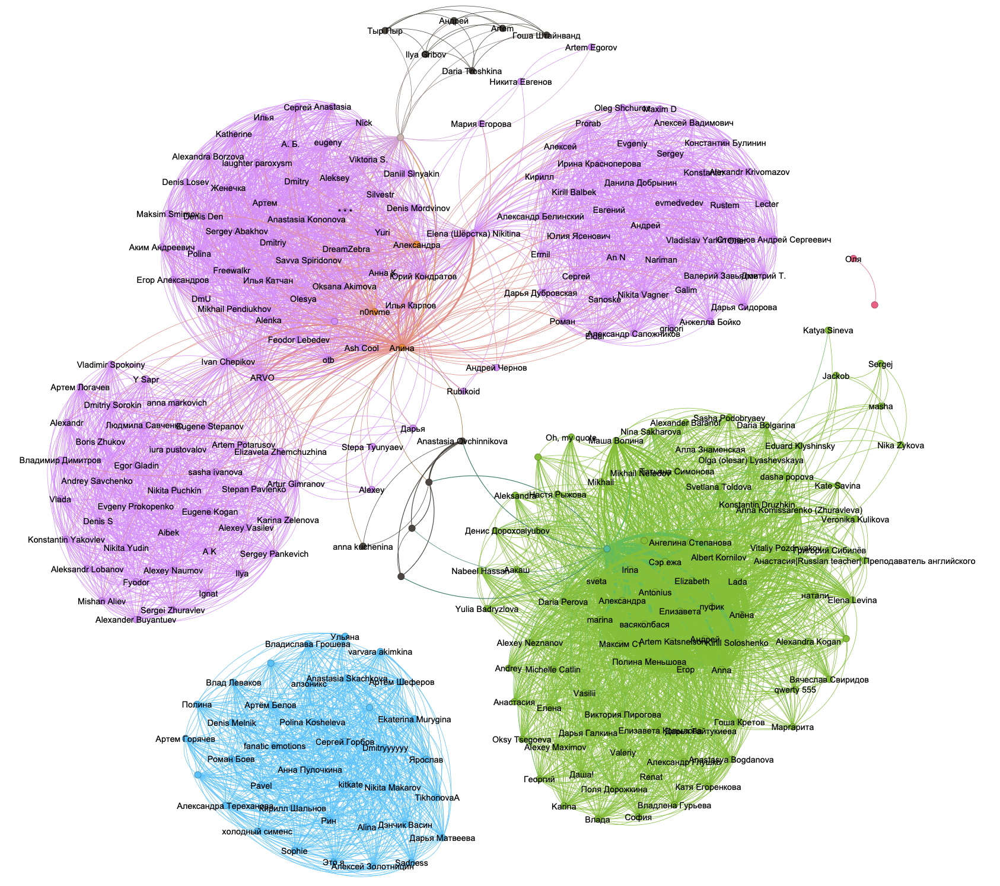

In [3]:
display(Image("tg_graph.png", width=600, height=600))

### Degree distribution. Is your network scale-free? Compare with what is expected in a random network

N: 277 E: 5947
min degree: 1 max degree: 137 mean: 42.938628158844764


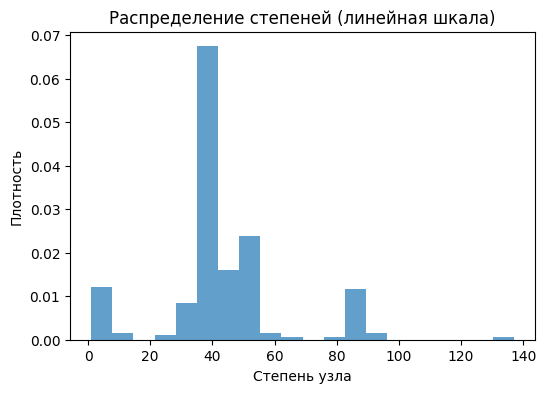

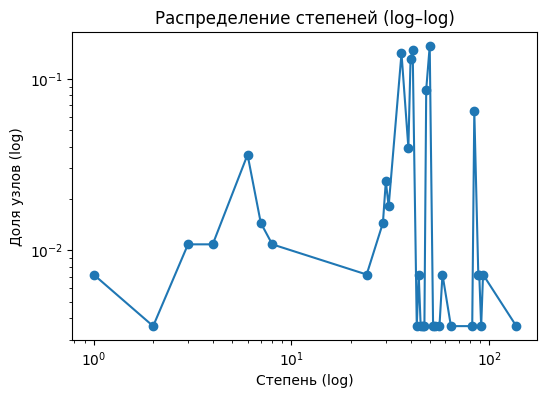

In [4]:
deg = np.array([d for _, d in G.degree()])
print("N:", G.number_of_nodes(), "E:", G.number_of_edges())
print("min degree:", deg.min(), "max degree:", deg.max(), "mean:", deg.mean())

plt.figure(figsize=(6,4))
plt.hist(deg, bins=20, density=True, alpha=0.7)
plt.xlabel("Степень узла")
plt.ylabel("Плотность")
plt.title("Распределение степеней (линейная шкала)")
plt.show()

vals, counts = np.unique(deg, return_counts=True)
plt.figure(figsize=(6,4))
plt.loglog(vals, counts/len(deg), "o-")
plt.xlabel("Степень (log)")
plt.ylabel("Доля узлов (log)")
plt.title("Распределение степеней (log–log)")
plt.show()

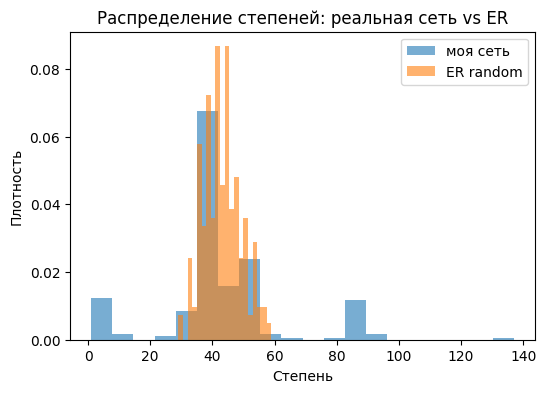

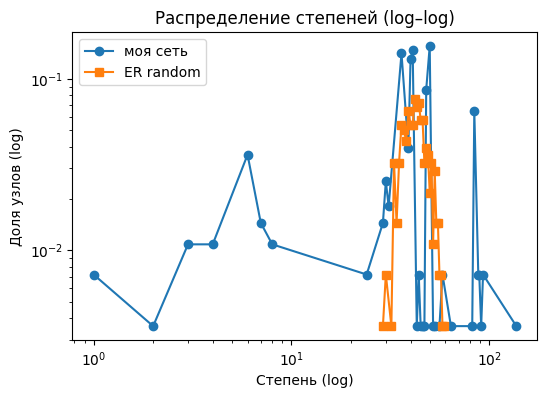

In [5]:
n = G.number_of_nodes()
m = G.number_of_edges()
G_er = nx.gnm_random_graph(n, m, seed=42)
deg_er = np.array([d for _, d in G_er.degree()])

plt.figure(figsize=(6,4))
plt.hist(deg,    bins=20, density=True, alpha=0.6, label="моя сеть")
plt.hist(deg_er, bins=20, density=True, alpha=0.6, label="ER random")
plt.xlabel("Степень")
plt.ylabel("Плотность")
plt.legend()
plt.title("Распределение степеней: реальная сеть vs ER")
plt.show()

vals_real, counts_real = np.unique(deg, return_counts=True)
vals_er,   counts_er   = np.unique(deg_er, return_counts=True)

plt.figure(figsize=(6,4))
plt.loglog(vals_real, counts_real/len(deg),   "o-", label="моя сеть")
plt.loglog(vals_er,   counts_er/len(deg_er), "s-", label="ER random")
plt.xlabel("Степень (log)")
plt.ylabel("Доля узлов (log)")
plt.legend()
plt.title("Распределение степеней (log–log)")
plt.show()

По графикам распределения степеней видно, что моя сеть отличается от случайного графа ER: у ER‑графа степени плотно сосредоточены вокруг среднего значения, тогда как в моей сети распределение более растянуто и в правой части есть несколько вершин с существенно более высокой степенью, чем у основной массы узлов. На log–log графике хвост распределения степеней у моей сети убывает медленнее, чем у ER, но при этом не образует устойчивой прямой линии, а заметно загибается. В случае настоящего степенного закона на log–log графике хвост выглядел бы как прямая; здесь этого нет, поэтому сеть не является классической scale‑free. Более тяжёлый хвост по сравнению с ER объясняется тем, что несколько крупных и пересекающихся чатов порождают отдельные вершины с очень большой степенью, но не формируют гладкий степенной хвост.

### Average distance. Is your network small-world? Compare with what is expected in a random network

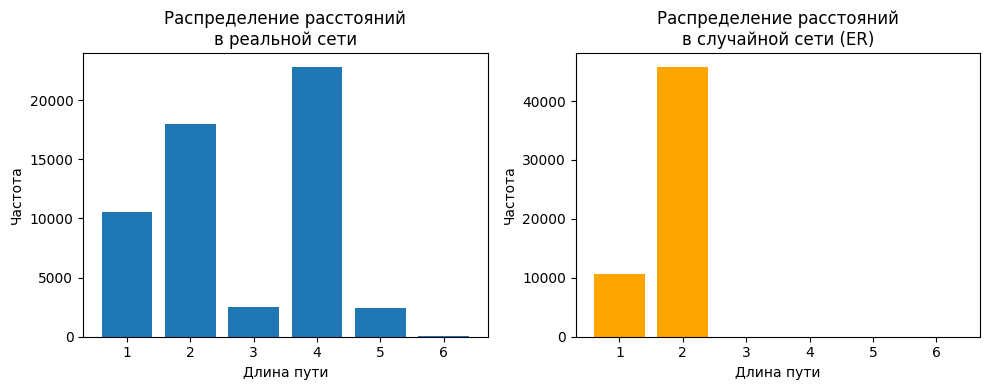

In [6]:
components = list(nx.connected_components(G))
largest_cc = max(components, key=len)
H = G.subgraph(largest_cc).copy()

n = H.number_of_nodes()
m = H.number_of_edges()
G_er = nx.gnm_random_graph(n, m, seed=42)
components_er = list(nx.connected_components(G_er))
largest_cc_er = max(components_er, key=len)
H_er = G_er.subgraph(largest_cc_er).copy()

dists_real = []
for _, lengths in nx.all_pairs_shortest_path_length(H):
    dists_real.extend(lengths.values())

dists_er = []
for _, lengths in nx.all_pairs_shortest_path_length(H_er):
    dists_er.extend(lengths.values())

max_d = max(max(dists_real), max(dists_er))
bins = range(1, max_d + 2)

plt.figure(figsize=(10,4))

plt.subplot(1, 2, 1)
plt.hist(dists_real, bins=bins, align="left", rwidth=0.8)
plt.xlabel("Длина пути")
plt.ylabel("Частота")
plt.title("Распределение расстояний\nв реальной сети")

plt.subplot(1, 2, 2)
plt.hist(dists_er, bins=bins, align="left", rwidth=0.8, color="orange")
plt.xlabel("Длина пути")
plt.ylabel("Частота")
plt.title("Распределение расстояний\nв случайной сети (ER)")

plt.tight_layout()
plt.show()

В моей сети средняя длина кратчайшего пути составляет 2-4 шага, а большинство пар вершин соединяются малыми расстояниями, что соответствует эффекту small‑world. При сравнении со случайным графом ER с теми же N и E видно, что пути в моей сети лишь немного длиннее, что объясняется наличием сообществ и кластерной структуры по сравнению с полностью случайной моделью.

### Clustering coefficient. Does your network demonstrate high clustering? Compare with what is expected in a random network

In [7]:
C_real = nx.average_clustering(G)
local_real = list(nx.clustering(G).values())
print("average clustering моя сеть:", C_real)

n = G.number_of_nodes()
m = G.number_of_edges()

G_er = nx.gnm_random_graph(n, m, seed=42)

C_er = nx.average_clustering(G_er)
local_er = list(nx.clustering(G_er).values())
print("average clustering случайная сеть:", C_er)

average clustering моя сеть: 0.9420663448366251
average clustering случайная сеть: 0.15654493523979884


Моя сеть демонстрирует практически максимальную кластеризацию: почти у всех вершин соседи плотным треугольником связаны между собой. В случайной сети с теми же N и E кластеризация намного ниже, поэтому моя сеть существенно более кластеризована, чем можно ожидать в случайной модели.

## Compare your network with network models, such as ER, BA, WS. Why does your network look similar/dissimilar?

In [8]:
def metrics(H):
    n = H.number_of_nodes()
    m = H.number_of_edges()
    deg = np.array([d for _, d in H.degree()])
    C = nx.average_clustering(H)
    comps = list(nx.connected_components(H))
    Hcc = H.subgraph(max(comps, key=len)).copy()
    L = nx.average_shortest_path_length(Hcc)
    return {
        "N": n,
        "E": m,
        "avg_degree": deg.mean(),
        "max_degree": deg.max(),
        "clustering": C,
        "avg_path_len": L,
    }

real = metrics(G)

n, m = G.number_of_nodes(), G.number_of_edges()
deg_real = np.array([d for _, d in G.degree()])
avg_deg = deg_real.mean()

G_er = nx.gnm_random_graph(n, m, seed=42)
G_ba = nx.barabasi_albert_graph(n, int(max(1, round(avg_deg/2))), seed=42)

k_ws = int(round(avg_deg))
if k_ws % 2 == 1:
    k_ws += 1
if k_ws >= n:
    k_ws = n-1 if (n-1) % 2 == 0 else n-2
G_ws = nx.watts_strogatz_graph(n, k_ws, 0.1, seed=42)

df_models = pd.DataFrame.from_dict(
    {
        "REAL": real,
        "ER": metrics(G_er),
        "BA": metrics(G_ba),
        "WS": metrics(G_ws),
    },
    orient="index"
)

df_models

,N,E,avg_degree,max_degree,clustering,avg_path_len
REAL,277,5947,42.938628,137,0.942066,2.801759
ER,277,5947,42.938628,59,0.156545,1.845184
BA,277,5376,38.815884,116,0.226626,1.873123
WS,277,6094,44.000000,52,0.551952,1.973526


Моя сеть совсем не похожа на случайный ER‑граф: при тех же N и E у неё в 6 раз выше кластеризация (0.94 против 0.16) и гораздо больший максимум степени (137 против 59), что указывает на плотные сообщества. По наличию узлов с очень большой степенью она ближе к BA‑модели (max_degree 137 против 116), но BA даёт гораздо более низкую кластеризацию (0.23), тогда как у меня почти все связи собраны в квази‑клики чатов. По сочетанию коротких путей и высокой кластеризации моя сеть больше всего похожа на small‑world‑модель WS (но еще более высокая средняя длина пути и кластеризация), то есть она ведёт себя как усиленная WS‑сеть с дополнительной scale‑free‑подобной неоднородностью степеней из‑за проекции групповых чатов в клики.

## Centrality measures. Find top nodes by Degree, Betweenness, Closeness, Eigenvector centrality. Why are these people the top nodes in your network? Show how your friends’ personal properties correspond to nodes’ structural properties.

In [9]:
group_counts = df.groupby("user_id")["group_name"].nunique().to_dict()
nx.set_node_attributes(G, group_counts, "num_groups")

deg_c = {n: d for n, d in G.degree()}
bet_c = nx.betweenness_centrality(G)
clo_c = nx.closeness_centrality(G)
eig_c = nx.eigenvector_centrality(G, max_iter=1000)

def show_top(cent, name, k=5):
    print(f"\n{name}:")
    for uid, score in sorted(cent.items(), key=lambda x: x[1], reverse=True)[:k]:
        data = G.nodes[uid]
        label = data.get("label", str(uid))
        num_groups = data.get("num_groups", "NA")
        classes = data.get("classes", "")
        print(
            f"{label} | score={score:.4f}, degree={deg_c[uid]}, "
            f"чатов={num_groups}, классы={classes}"
        )

show_top(deg_c, "Degree")
show_top(bet_c, "Betweenness")
show_top(clo_c, "Closeness")
show_top(eig_c, "Eigenvector")


Degree:
Алина | score=137.0000, degree=137, чатов=9, классы=работа; друзья
Elena (Шёрстка) Nikitina | score=93.0000, degree=93, чатов=5, классы=работа
ARVO | score=93.0000, degree=93, чатов=5, классы=работа
Ivan Chepikov | score=91.0000, degree=91, чатов=4, классы=работа
Женя 🪄 | score=89.0000, degree=89, чатов=12, классы=друзья; учеба

Betweenness:
Алина | score=0.4531, degree=137, чатов=9, классы=работа; друзья
Женя 🪄 | score=0.3497, degree=89, чатов=12, классы=друзья; учеба
Алиса Комрад 🤜🤛 | score=0.1745, degree=6, чатов=4, классы=друзья
Anastasia Ovchinnikova | score=0.1745, degree=6, чатов=4, классы=друзья
Ярослав 💘 | score=0.0421, degree=58, чатов=6, классы=друзья; работа

Closeness:
Алина | score=0.4733, degree=137, чатов=9, классы=работа; друзья
Алиса Комрад 🤜🤛 | score=0.4240, degree=6, чатов=4, классы=друзья
Anastasia Ovchinnikova | score=0.4240, degree=6, чатов=4, классы=друзья
Женя 🪄 | score=0.3804, degree=89, чатов=12, классы=друзья; учеба
Elena (Шёрстка) Nikitina | score=

Degree centrality.
Чем больше связей у вершины, тем выше ее degree центральность. В топ по degree‑центральности у меня попали в первую очередь коллеги с работы: Алина, Elena (Шёрстка) Nikitina, ARVO и Ivan Chepikov. Мы с Алиной и Еленой состоим практически во всех крупных рабочих чатах вместе (есть огромные чаты с целой группой заказчиков, поэтому там много связей), а ARVO и Иван тоже входят в несколько общих рабочих бесед (хотя и меньшего размера), поэтому у них очень много соседей в графе. Женя попадает в тот же топ с чуть меньшей степенью, потому что она одновременно участвует в большом количестве учебных чатов (в том числе по отдельным проектам), большинство из которых содержат всех однокурсников, и ещё в одном или двух чатах с друзьями, то есть структурно она тоже сильно пересекает разные подгруппы и накапливает много связей.

Betweenness centrality.
Как часто вершина лежит на кратчайших путях между другими парами узлов. В моём графе в топ по betweenness попадают Алина и Женя, которые соединяют сразу несколько разных кругов: Алина связывает большие рабочие чаты с одним из дружеских, а Женя одновременно участвует во множестве учебных чатов и в чате друзей, поэтому через них проходят многие кратчайшие пути между рабочими, учебными и дружескими компонентами. Алиса и Anastasia Ovchinnikova находятся в нескольких небольших дружеских чатах и вместе с Алиной и Женей входят в общий чат по HSE RUN, из‑за чего они связывают разные дружеские подгруппы. Ярослав сочетает пару общих чатов с друзьями и несколько рабочих чатов, так что он служит мостом между частью дружеского круга и одним из рабочих кластеров.

Closeness centrality.
Насколько близко вершина находится к остальным. В моём графе по closeness снова лидирует Алина: она состоит почти во всех крупных рабочих чатах и ещё в одном дружеском, поэтому от неё минимальное число шагов до большей части сети. Алиса и Anastasia Ovchinnikova, хотя и имеют небольшую степень, находятся в нескольких пересекающихся дружеских чатах (в том числе общем чате с Алиной и Женей), за счёт чего оказываются в центре дружеского кластера и тоже имеют очень малую среднюю дистанцию до других. Женя соединяет множество учебных чатов и один или два чата друзей, поэтому у неё короткие пути как до учебной части сети, так и до дружеской. Elena (Шёрстка) Nikitina — одна из ключевых фигур в рабочих чатах, и внутри рабочего кластера через неё удобнее всего дотянуться до остальных коллег, что даёт ей высокую closeness‑центральность.

Eigenvector centrality.
Узел считается важным, если он связан с другими важными узлами, а не просто с большим числом случайных соседей. В моём графе в топ по eigenvector попали почти исключительно люди из учебного ядра: Albert Kornilov, Lada и Ангелина Степанова состоят со мной сразу в нескольких чатах по одному и тому же учебному проекту, а также в общих учебных беседах всего потока по разным предметам. Artem Katsnelson входит в те же проектные и общие учебные чаты вместе с ними, поэтому тоже оказывается глубоко внутри плотного учебного кластера. Женя появляется здесь ещё раз, потому что она одновременно состоит в большом числе учебных чатов с этой группой и дополнительно связана с другими важными узлами (и по учёбе, и по дружеским чатам), поэтому её соседи сами имеют высокую степень и высокую центральность.

На самом деле часто после 5 места, идут люди с похожими скорами для многих центральностей, потому что состоят в одинаковых чатах.

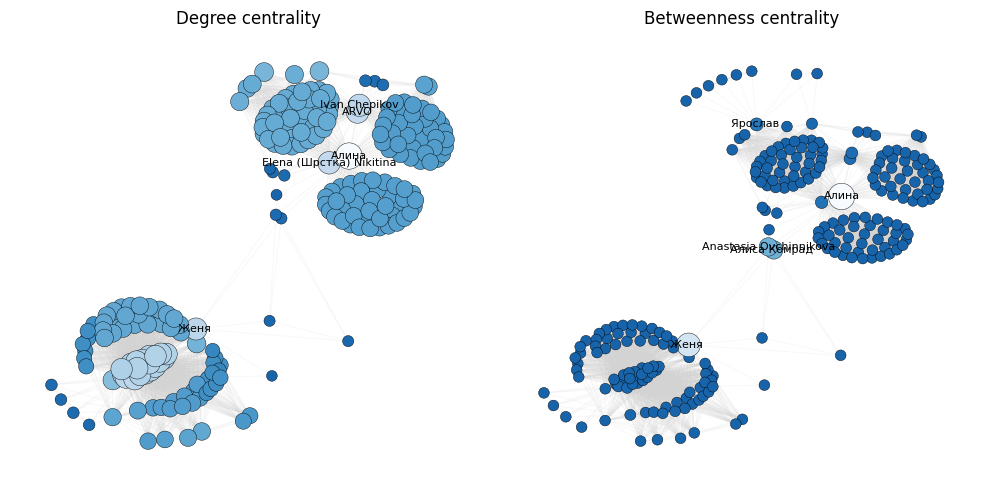

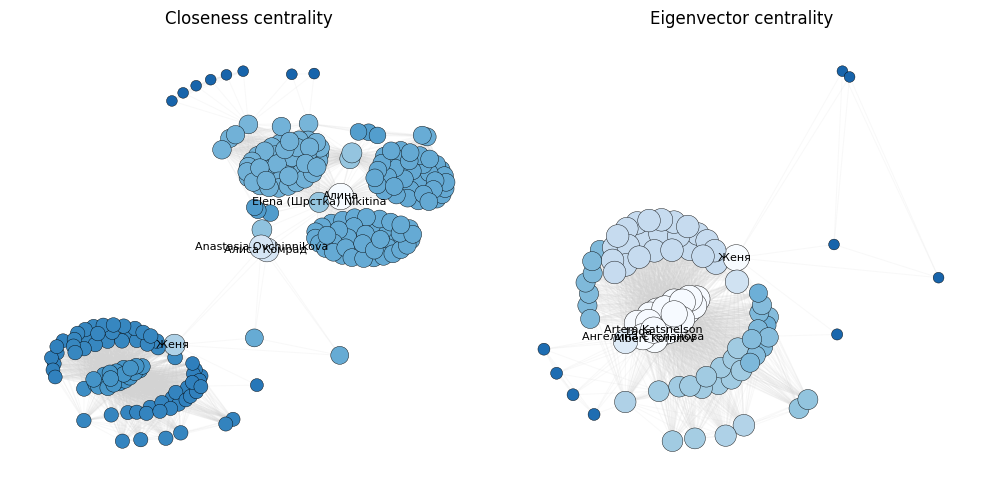

In [10]:
pos_full = nx.kamada_kawai_layout(G)

_allowed = re.compile(r"[A-Za-zА-Яа-я0-9 @\.\-\_\(\)]")

def clean_label(text):
    if not isinstance(text, str):
        text = str(text)
    return "".join(ch for ch in text if _allowed.match(ch))

def plot_centrality_subgraph_ax(cent_dict, title, ax, top_k=20, top_labels=5):
    top_nodes = sorted(cent_dict, key=cent_dict.get, reverse=True)[:top_k]

    nodes_set = set(top_nodes)
    for n in top_nodes:
        nodes_set.update(G.neighbors(n))
    H = G.subgraph(nodes_set).copy()
    pos = {n: pos_full[n] for n in H.nodes()}

    vals = np.array([cent_dict[n] for n in H.nodes()])
    vmin, vmax = vals.min(), vals.max()
    if vmax > vmin:
        sizes = 60 + (vals - vmin) / (vmax - vmin) * 300
    else:
        sizes = np.full_like(vals, 200)

    norm = (vals - vmin) / (vmax - vmin + 1e-9)
    colors = plt.cm.Blues_r(0.2 + 0.8 * norm)

    ax.set_title(title)

    nx.draw_networkx_edges(
        H, pos,
        alpha=0.15, width=0.7, edge_color="lightgray", ax=ax
    )
    nx.draw_networkx_nodes(
        H, pos,
        node_size=sizes,
        node_color=colors,
        linewidths=0.3,
        edgecolors="black",
        ax=ax
    )

    label_nodes = sorted(cent_dict, key=cent_dict.get, reverse=True)[:top_labels]
    labels = {
        n: clean_label(G.nodes[n].get("label", str(n)))
        for n in label_nodes if n in H.nodes()
    }
    nx.draw_networkx_labels(H, pos, labels=labels, font_size=8, ax=ax)

    ax.axis("off")


fig, axes = plt.subplots(1, 2, figsize=(10, 5))

plot_centrality_subgraph_ax(deg_c, "Degree centrality",      axes[0])
plot_centrality_subgraph_ax(bet_c, "Betweenness centrality", axes[1])

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

plot_centrality_subgraph_ax(clo_c, "Closeness centrality",   axes[0])
plot_centrality_subgraph_ax(eig_c, "Eigenvector centrality", axes[1])

plt.tight_layout()
plt.show()

## (Optional) Degree mixing pattern. Why is your network assortative/disassortative by node degree?

Degree assortativity coefficient: 0.005253761145762757


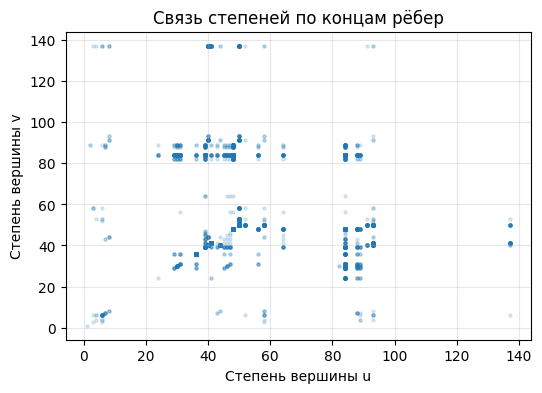

In [11]:
r = nx.degree_assortativity_coefficient(G)
print("Degree assortativity coefficient:", r)

deg = dict(G.degree())
x, y = zip(*[(deg[u], deg[v]) for u, v in G.edges()])

plt.figure(figsize=(6,4))
plt.scatter(x, y, s=5, alpha=0.15)
plt.xlabel("Степень вершины u")
plt.ylabel("Степень вершины v")
plt.title("Связь степеней по концам рёбер")
plt.grid(alpha=0.3)
plt.show()

Коэффициент ассортативности по степени получился почти нулевым, то есть сеть почти нейтральна: вершины с большой степенью не проявляют явного предпочтения ни к таким же вершинам с большой степенью, ни к малостепенным узлам. Это логично для моей конструкции графа: внутри отдельных чатов участники имеют похожие степени (что тянет ассортативность вверх), но при этом многие связи идут от очень активных людей к участникам небольших или одиночных чатов, создавая множество пар high–low и в сумме почти обнуляя общий эффект.

## (Optional) Attributes mixing pattern. Why is your network assortative/disassortative by node attributes?

Attribute assortativity by main_class: 0.9607646145248729


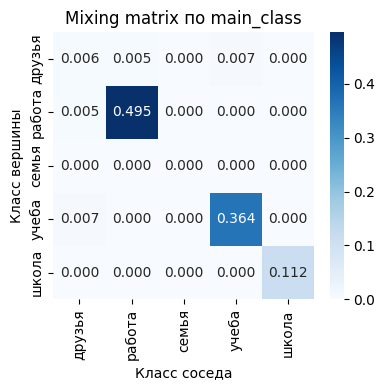

In [12]:
for n, data in G.nodes(data=True):
    cls_str = str(data.get("classes", "")).strip()
    if cls_str:
        main_cls = cls_str.split(";")[0].strip()
    else:
        main_cls = "none"
    data["main_class"] = main_cls

classes = sorted({data["main_class"] for _, data in G.nodes(data=True)})
mapping = {cls: i for i, cls in enumerate(classes)}

r_attr = nx.attribute_assortativity_coefficient(G, "main_class")
print("Attribute assortativity by main_class:", r_attr)

M = nx.attribute_mixing_matrix(
    G,
    "main_class",
    mapping=mapping,
    normalized=True
)

plt.figure(figsize=(4, 4))
sns.heatmap(
    M,
    annot=True,
    fmt=".3f",
    cmap="Blues",
    xticklabels=classes,
    yticklabels=classes,
)
plt.xlabel("Класс соседа")
plt.ylabel("Класс вершины")
plt.title("Mixing matrix по main_class")
plt.tight_layout()
plt.show()

Коэффициент ассортативности по атрибуту class почти максимальный: на heatmap видно, что подавляющее большинство рёбер лежит на диагонали — это связи работа–работа, учёба–учёба, школа–школа. Небольшие недиагональные связи появляются в основном для пар друзья–работа и друзья–учёба, то есть друзья выступают редкими мостами между разными типами групп. В целом сеть демонстрирует очень сильную гомофилию по типу групп, что естественно для структуры, построенной из отдельных рабочих, учебных и школьных чатов.

## Apply 2-3 community detection algorithms and compare them by Modularity.

Для обнаружения сообществ я использовала три алгоритма: greedy modularity, Louvain и label propagation. Greedy‑алгоритм (Clauset–Newman–Moore) и Louvain метод оба прямо оптимизируют модулярность и являются классическими подходами для поиска плотных кластеров в социальных сетях; Louvain считается стандартом из‑за хорошего качества и скорости, а greedy служит понятным базовым сравнением. Алгоритм label propagation работает по другому принципу (распространение меток по локальному большинству), очень быстрый и не требует настройки параметров, поэтому я использую его как альтернативный, немодулярный способ разбиения и сравниваю его результат по модулярности с методами, оптимизирующими модулярность напрямую.

In [13]:
# Greedy modularity
greedy_coms = list(nx.algorithms.community.greedy_modularity_communities(G))
mod_greedy = nx.algorithms.community.modularity(G, greedy_coms)
print(f"Greedy: сообществ = {len(greedy_coms)}, modularity = {mod_greedy:.4f}")

# Louvain
louvain_coms = nx.algorithms.community.louvain_communities(G, seed=42)
mod_louvain = nx.algorithms.community.modularity(G, louvain_coms)
print(f"Louvain: сообществ = {len(louvain_coms)}, modularity = {mod_louvain:.4f}")

# Label propagation
label_coms = list(nx.algorithms.community.label_propagation_communities(G))
mod_label = nx.algorithms.community.modularity(G, label_coms)
print(f"Label propagation: сообществ = {len(label_coms)}, modularity = {mod_label:.4f}")

Greedy: сообществ = 7, modularity = 0.6269
Louvain: сообществ = 8, modularity = 0.6287
Label propagation: сообществ = 5, modularity = 0.5615


Модулярности у всех трёх алгоритмов довольно высокие, что говорит о сильной и чётко выраженной сообщественной структуре сети.

Если сравнивать алгоритмы между собой, Louvain даёт чуть лучшую модулярность, практически совпадая по качеству с greedy modularity, тогда как label propagation находит меньше сообществ и показывает заметно более низкую модулярность.

In [14]:
def add_partition_attr(G, communities, attr_name, default=-1):
    mapping = {n: default for n in G.nodes()}
    for i, comm in enumerate(communities):
        for n in comm:
            mapping[n] = i
    nx.set_node_attributes(G, mapping, attr_name)

add_partition_attr(G, greedy_coms,  "comm_greedy")
add_partition_attr(G, louvain_coms, "comm_louvain")
add_partition_attr(G, label_coms,   "comm_label")

nx.write_gexf(G, "tg_graph_with_communities.gexf")

### Greedy modularity

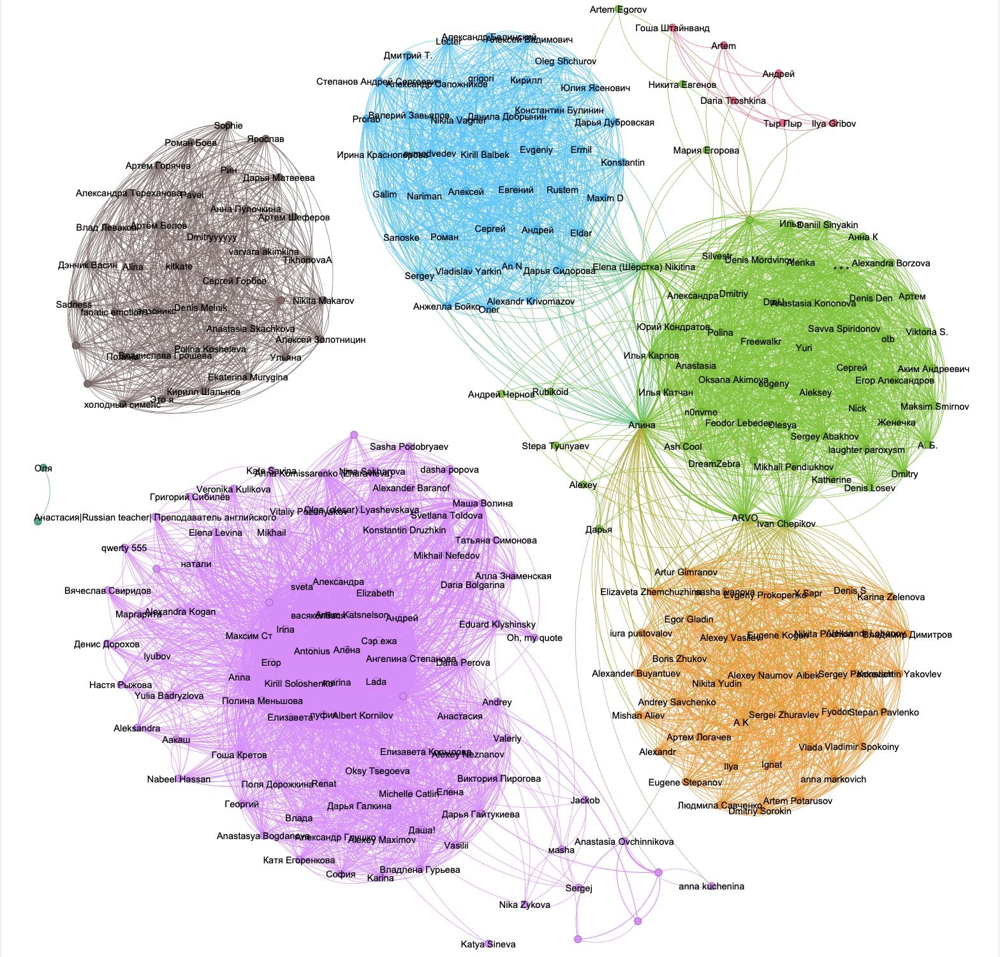

In [15]:
display(Image("greedy_comm.png", width=600, height=600))

### Louvain

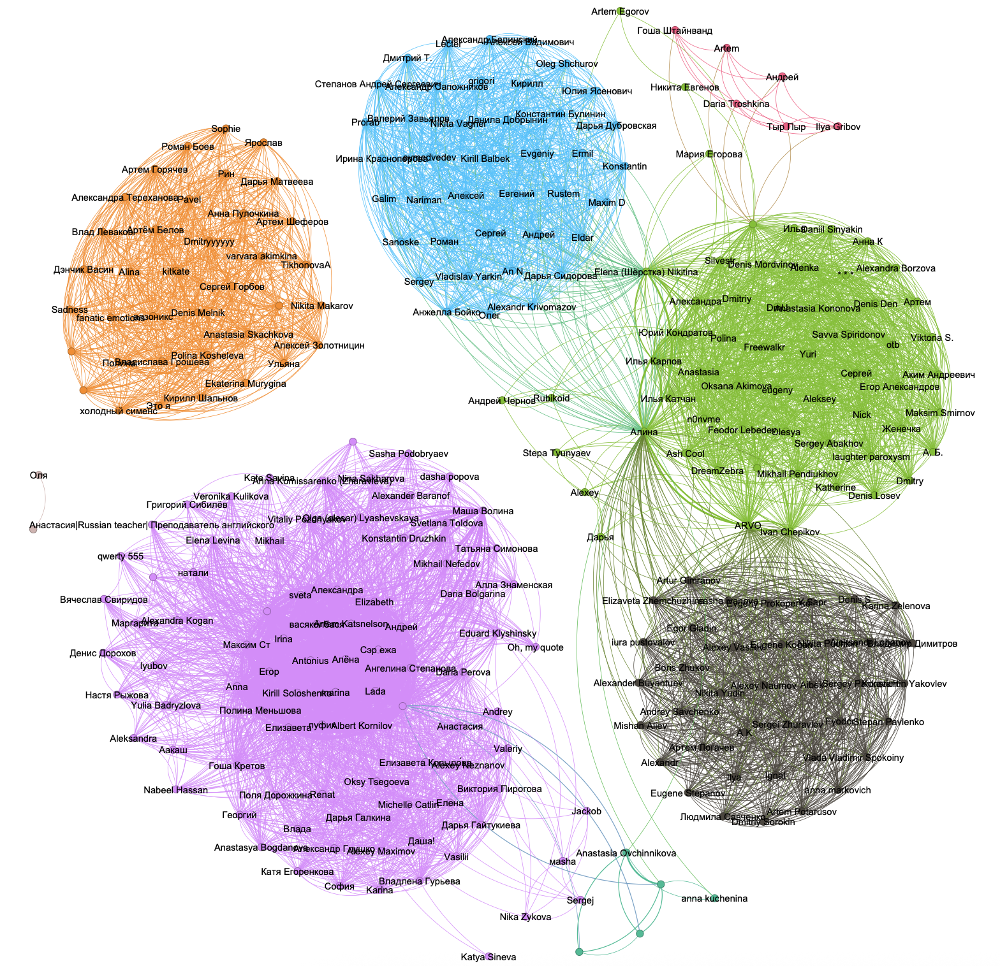

In [16]:
display(Image("louvain_comm.png", width=600, height=600))

### Label propagation

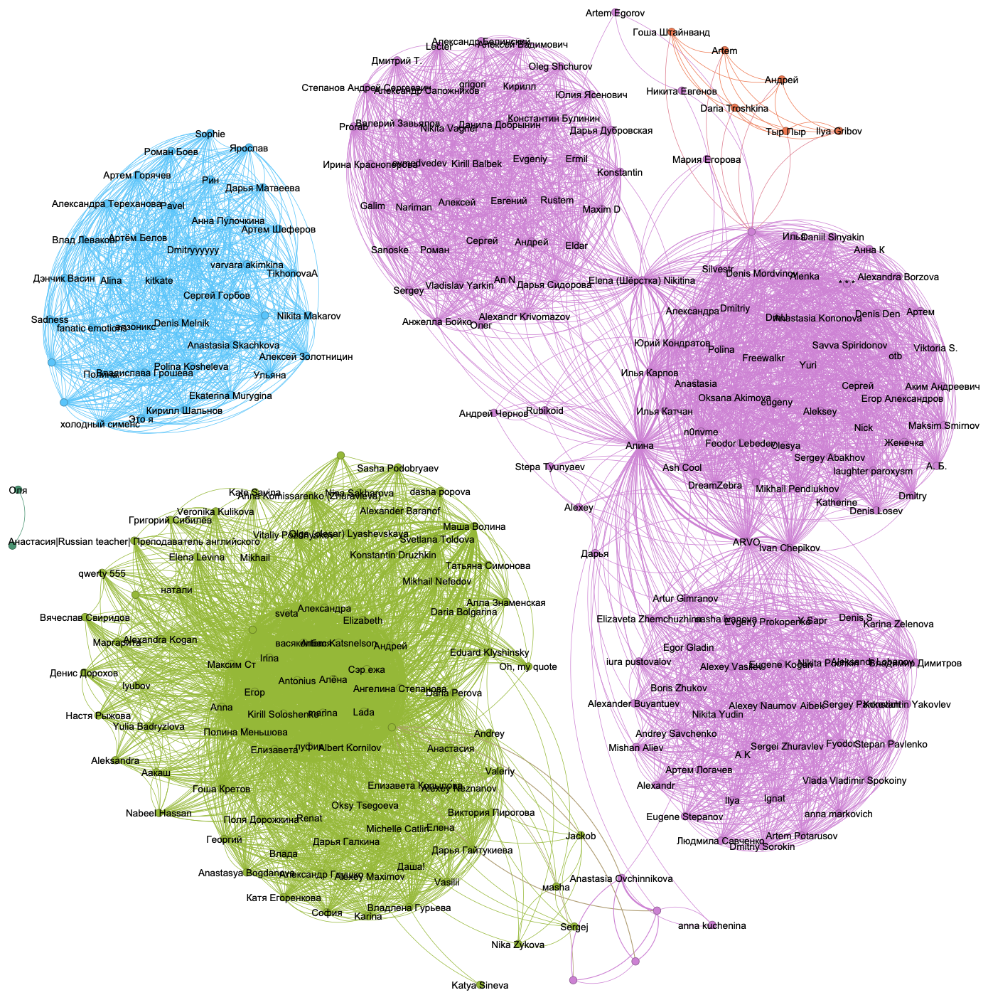

In [17]:
display(Image("label_comm.png", width=600, height=600))

## (Optional) Manually find the ground truth communities in your network. Describe how you found them.

Этот скрипт использует предварительно размеченный файл tg_data_ground_truth.csv, в котором каждая строка — это участие пользователя в чате с полем ground_truth_comm. Для каждого пользователя он собирает все встречающиеся значения ground_truth_comm; если пользователь попал сразу в несколько разных кластеров, скрипт интерактивно спрашивает меня, к какому именно кластеру его отнести. Затем итоговое соответствие user_id → ground_truth_comm записывается в ground_truth_nodes.csv, и на его основе строится граф tg_graph_ground_truth.gexf, в котором у каждой вершины есть атрибут ground_truth_comm. Это разбиение я использую как ручную ground truth‑разметку сообществ для последующего сравнения с алгоритмами поиска сообществ.

In [18]:
df = pd.read_csv("tg_data_ground_truth.csv")

user_to_comms = (
    df.groupby("user_id")["ground_truth_comm"]
      .apply(lambda s: sorted(set(str(x) for x in s.dropna())))
)

final_mapping = {}

for user_id, comms in user_to_comms.items():
    sub = df[df["user_id"] == user_id].iloc[0]
    name = sub.get("name", "")
    username = sub.get("username", "")
    label = f"{name} (@{username})" if pd.notna(username) and username else name

    if len(comms) == 1:
        final_mapping[user_id] = comms[0]
    else:
        print(f"\nПользователь {label} (id={user_id}) встречается в нескольких кластерах:")
        for i, c in enumerate(comms, 1):
            print(f"  {i}. {c}")
        choice = input("К какому кластеру отнести этого пользователя: ").strip()

        gt = choice or comms[0]
        final_mapping[user_id] = gt

mapping_df = pd.DataFrame(
    [{"user_id": uid, "ground_truth_comm": comm} for uid, comm in final_mapping.items()]
)
mapping_df.to_csv("ground_truth_nodes.csv", index=False)

G = nx.Graph()

for user_id, sub in df.groupby("user_id"):
    name = sub["name"].iloc[0]
    username = sub["username"].iloc[0]
    classes = "; ".join(sorted(set(str(x) for x in sub["class"].dropna())))
    gt_comm = final_mapping.get(user_id, "none")

    G.add_node(
        user_id,
        label=name,
        username=username,
        classes=classes,
        ground_truth_comm=gt_comm,
    )

for group_idx, sub in df.groupby("group_idx"):
    users = list(sub["user_id"].unique())
    for u, v in combinations(users, 2):
        if G.has_edge(u, v):
            G[u][v]["weight"] += 1
        else:
            G.add_edge(u, v, weight=1)

nx.write_gexf(G, "tg_graph_ground_truth.gexf")


Пользователь Илья Карпов (@karpovilia) (id=94575705) встречается в нескольких кластерах:
  1. работа_1
  2. работа_3
К какому кластеру отнести этого пользователя: работа_3

Пользователь Elena (Шёрстка) Nikitina (@Shorstko) (id=155568652) встречается в нескольких кластерах:
  1. работа_2
  2. работа_3
К какому кластеру отнести этого пользователя: работа_3

Пользователь ARVO (@mr_arvo) (id=206709618) встречается в нескольких кластерах:
  1. работа_1
  2. работа_2
  3. работа_3
К какому кластеру отнести этого пользователя: работа_3

Пользователь Александра (@AlexaMartlet) (id=410112220) встречается в нескольких кластерах:
  1. работа_2
  2. работа_3
К какому кластеру отнести этого пользователя: работа_3

Пользователь Ярослав 💘 (@gor_yar) (id=438200603) встречается в нескольких кластерах:
  1. друзья_2
  2. работа_3
К какому кластеру отнести этого пользователя: работа_3

Пользователь Ivan Chepikov (@darttusin) (id=489684053) встречается в нескольких кластерах:
  1. работа_1
  2. работа_3


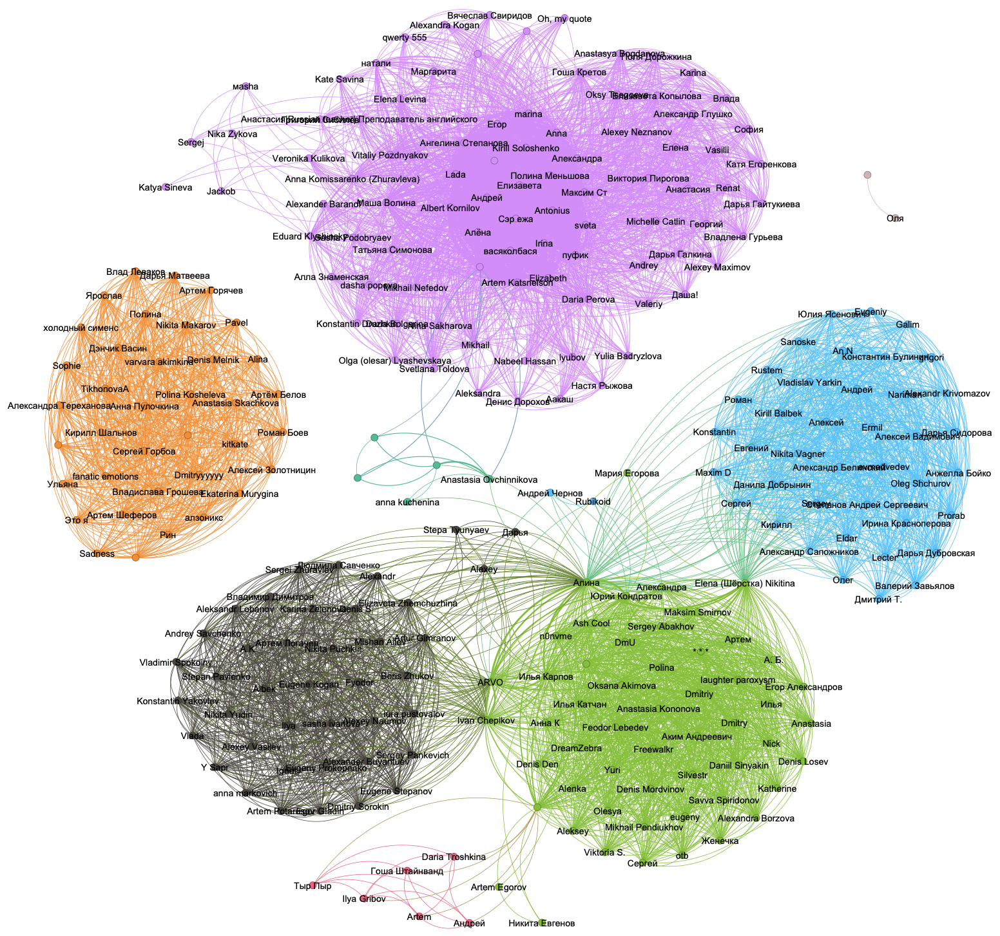

In [19]:
display(Image("ground_truth.png", width=600, height=600))

Ground truth‑сообщества я задала вручную, исходя из реального смысла чатов и визуализации сети. При просмотре графа и таблицы с участниками я выделила три рабочих кластера: один основной рабочий чат, где присутствуют почти все мои коллеги, и два отдельных кластера по проектам, которые отражают рабочие беседы с конкретными заказчиками. Дружеские чаты я разделила на две небольшие компании, отдельно выделила школьный кластер, учебный кластер однокурсников и семейный чат. Если один и тот же человек попадал сразу в несколько групп, я вручную относила его к тому сообществу, с которым у меня чаще всего происходят взаимодействия (более активные чаты и более частое общение). В результате получилось 8 осмысленных сообществ, которые по составу и размерам хорошо согласуются с кластерами, найденными алгоритмом Louvain.

## (Optional) Compare the results with ground truth communities by NMI.

In [20]:
nodes = list(G.nodes())

gt_labels = [G.nodes[n].get("ground_truth_comm", "none") for n in nodes]

def nmi_with_gt(communities, name):
    label_map = {n: -1 for n in nodes}
    for i, comm in enumerate(communities):
        for n in comm:
            label_map[n] = i

    pred_labels = [label_map[n] for n in nodes]
    score = normalized_mutual_info_score(gt_labels, pred_labels)
    print(f"NMI(ground truth, {name}) = {score:.4f}")
    return score

nmi_greedy = nmi_with_gt(greedy_coms,  "Greedy")
nmi_louvain = nmi_with_gt(louvain_coms, "Louvain")
nmi_label = nmi_with_gt(label_coms,    "Label propagation")

NMI(ground truth, Greedy) = 0.9366
NMI(ground truth, Louvain) = 0.9585
NMI(ground truth, Label propagation) = 0.7801


Значения NMI показывают, что метод Louvain больше всего подходит для моей сети, greedy‑алгоритм чуть хуже, а label propagation заметно уступает. Это хорошо согласуется с модулярностью: Louvain и greedy напрямую оптимизируют модульность и почти идеально восстанавливают мои осмысленные кластеры (три рабочих проекта, две группы друзей, школа, учёба, семья), в то время как label propagation опирается только на локальное большинство меток. Из‑за того, что моя сеть состоит из плотных квази‑клик чатов, соединённых редкими мостами, локальное распространение меток склонно склеивать несколько соседних сообществ в один крупный кластер и терять границы между отдельными рабочими/дружескими группами. Поэтому для такого типа данных (проекция чатов) алгоритмы на основе модулярности (особенно Louvain) работают лучше, а label propagation даёт более грубое и менее точное разбиение.

## (Optional) Find cliques, apply k-cores decomposition.

In [26]:
pos = nx.kamada_kawai_layout(G)

all_cliques = list(clique.find_cliques(G))
sizes = np.array([len(c) for c in all_cliques])
print("Всего клик:", len(all_cliques))

sorted_idx = np.argsort(-sizes)
deg = dict(G.degree())

def plot_clique(idx):
    cl = all_cliques[sorted_idx[idx]]
    clique_nodes = set(cl)
    clique_edges = [
        (u, v) for u, v in G.edges()
        if u in clique_nodes and v in clique_nodes
    ]

    plt.figure(figsize=(8, 8))

    nx.draw_networkx_edges(
        G,
        pos,
        alpha=0.03,
        width=0.5,
        edge_color="gray",
    )
    nx.draw_networkx_nodes(
        G,
        pos,
        node_size=15,
        node_color="lightgray",
        linewidths=0,
    )

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=clique_edges,
        width=2.0,
        edge_color="#1f77b4",
        alpha=0.9,
    )
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=list(clique_nodes),
        node_size=120,
        node_color="#aec7e8",
        edgecolors="black",
        linewidths=0.8,
    )

    nodes_for_labels = sorted(clique_nodes, key=lambda n: deg[n], reverse=True)[:10]
    labels = {
        n: clean_label(G.nodes[n].get("label", str(n)))
        for n in nodes_for_labels
    }
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=8)

    plt.title(f"Clique {idx+1} (size={len(clique_nodes)})")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

Всего клик: 22


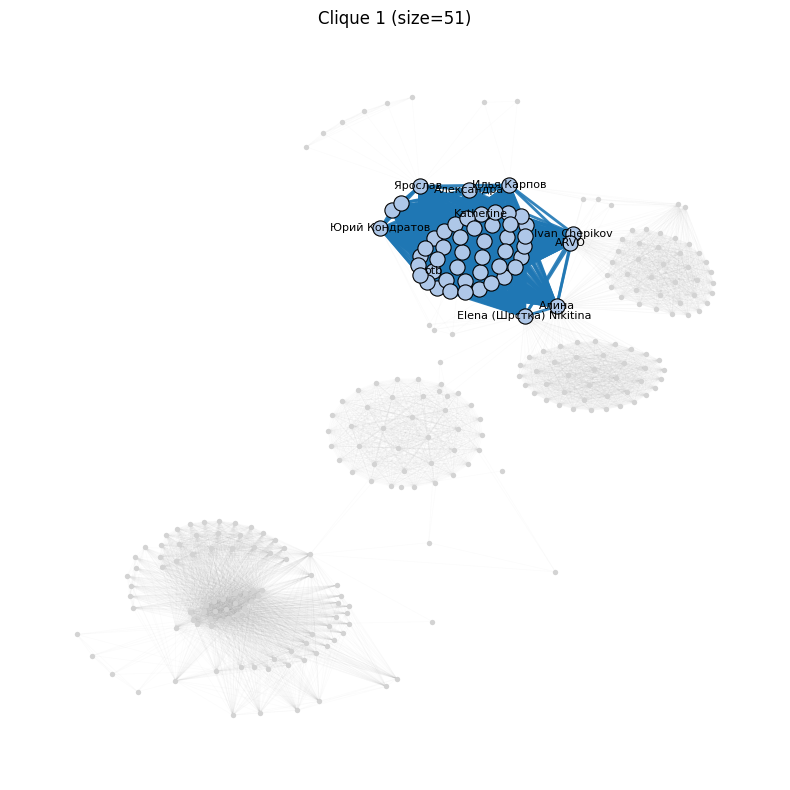

In [27]:
plot_clique(0)

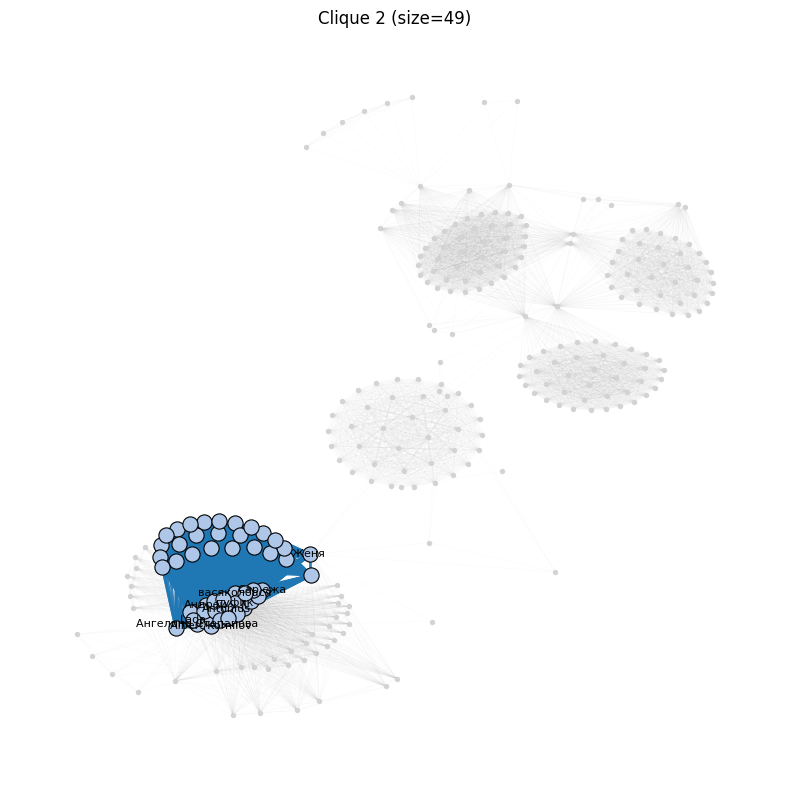

In [28]:
plot_clique(1)

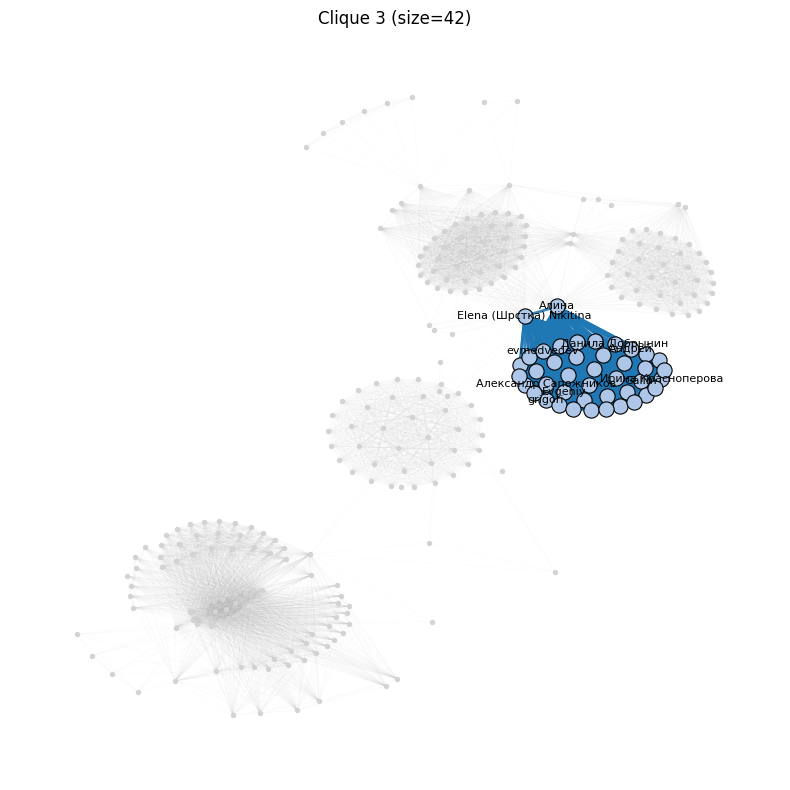

In [29]:
plot_clique(2)

Всего 22 максимальные клики в моей сети, я отдельно визуализировала несколько из них. Крупнейшие клики почти полностью совпадают с большими рабочими и учебными чатами: внутри таких чатов каждый участник связан практически со всеми остальными, поэтому они на графе выглядят как плотные полностью связные подграфы.

Максимальное k в k-core декомпозиции: 50


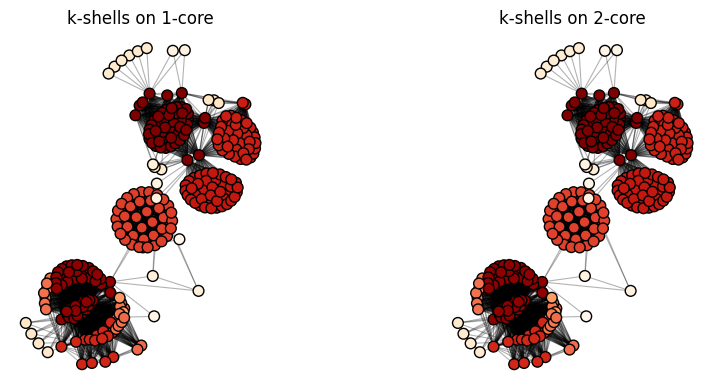

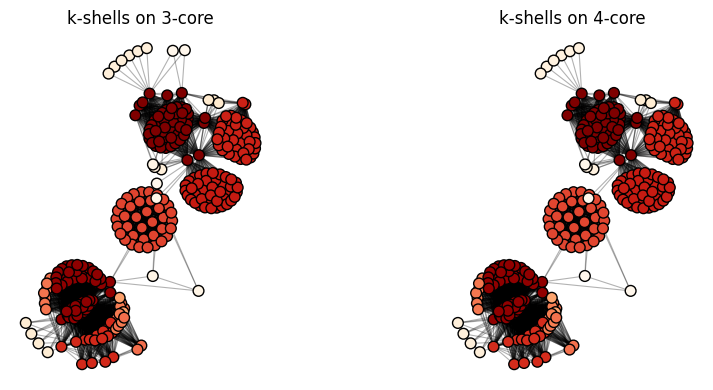

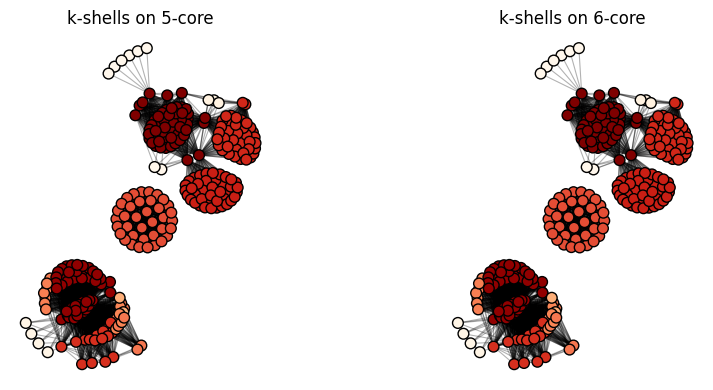

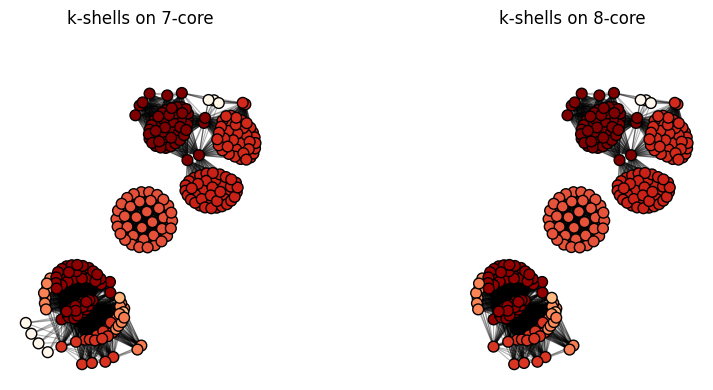

In [22]:
def k_core_decompose(H):
    return np.array(list(nx.core_number(H).values()))

pos = nx.kamada_kawai_layout(G)

core_numbers = nx.core_number(G)
max_k = max(core_numbers.values())
print("Максимальное k в k-core декомпозиции:", max_k)

xs, ys = np.array(list(pos.values())).T
x_min, x_max = xs.min(), xs.max()
y_min, y_max = ys.min(), ys.max()
eps = 0.05 * max(x_max - x_min, y_max - y_min)

n_cores = min(max_k, 8)
ks = list(range(1, n_cores + 1))

for start in range(0, len(ks), 2):
    pair = ks[start:start+2]

    fig, axes = plt.subplots(1, len(pair), figsize=(10, 4))
    if len(pair) == 1:
        axes = [axes]

    for ax, k in zip(axes, pair):
        subG = nx.k_core(G, k)

        nodes = nx.draw_networkx_nodes(
            subG,
            pos,
            cmap=plt.cm.OrRd,
            node_color=k_core_decompose(subG),
            node_size=60,
            edgecolors="black",
            ax=ax,
        )
        nx.draw_networkx_edges(
            subG,
            pos,
            alpha=0.3,
            width=0.8,
            edge_color="black",
            ax=ax,
        )

        ax.set_xlim(x_min - eps, x_max + eps)
        ax.set_ylim(y_min - eps, y_max + eps)
        ax.set_aspect("equal", "box")
        ax.axis("off")
        ax.set_title(f"k-shells on {k}-core")

    plt.tight_layout()
    plt.show()

K‑core декомпозиция показывает, что у моей сети есть выраженная структура ядро-периферия. На внешних слоях (малые k) присутствуют почти все вершины, в том числе маленькие семейные и дружеские чаты, но при увеличении k из графа постепенно удаляются именно небольшие и слабо связанные группы. В глубоких k‑core остаются в основном участники крупных рабочих и учебных чатов, у которых много взаимных связей друг с другом. Это означает, что плотное ядро сети формируют большие рабочие и учебные беседы, а семейные и части дружеских чатов лежат на периферии и исчезают уже при относительно небольших значениях k.